In [53]:
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
import math
from functools import partial
from matplotlib import pyplot as plt
import random
import seaborn as sns
from matplotlib import cm

import jax
import jax.numpy as jnp
from jax import grad, jit, vmap, jacobian

from sklearn.linear_model import LinearRegression
from tqdm import tqdm

from kernel_estimator import (
    Lambda,
    gauss,
    compute_lambda_d,
    kernel,
    kernel_estimator,
    plot_kernels)

from manifolds import (
    example_1d_density,
    compute_norm_constant,
    plot_example_1d_density,
    plot_example_1d_densities,
    examlpe_1d_density_sampling,
    example_parametric_curve,
    #submonifold_density

    example_2d_density,
    example_2d_density_sampling,
    plot_example_2d_density,
    example_parametric_surface

)

from utils import collect_mse_convergence, plot_convergence

key = jax.random.PRNGKey(0)

pi = np.pi


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


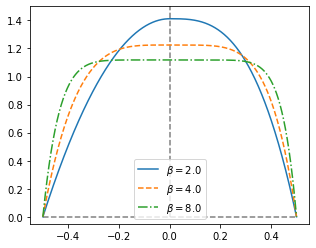

In [6]:
plot_example_1d_densities(savepath='../figs/1d_densities.png')

In [9]:
pts = examlpe_1d_density_sampling(2., int(1e4))

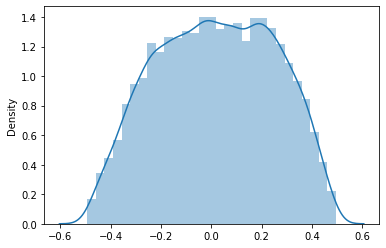

In [10]:
sns.distplot(pts.tolist())
plt.show()

In [12]:
a = 1./8
w = 6

In [13]:
grad_f = vmap(jax.jacobian(partial(example_parametric_curve, a=a, w=w)))


In [14]:
linsp = torch.linspace(0, 1, 1000)


manifold_pts = example_parametric_curve(linsp, a=a, w=w)

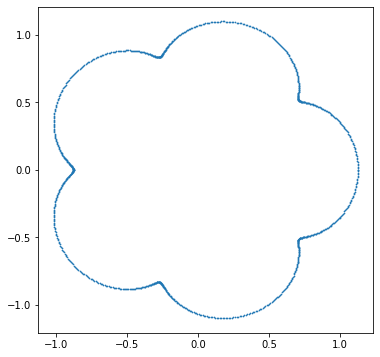

In [15]:
fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)

In [16]:
beta = 3.

In [17]:
pts = examlpe_1d_density_sampling(beta, int(1e3))
manifold_pts = example_parametric_curve(pts, a=1./8, w=6.)

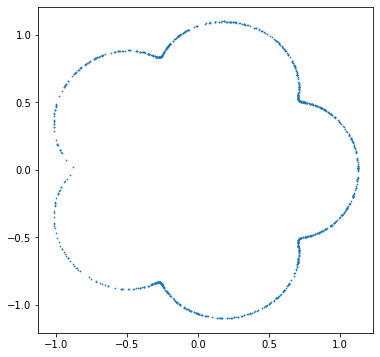

In [18]:
fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)

In [19]:
def submonifold_density(v):
    transformed = example_parametric_curve(v, a=a, w=w)
    grad = grad_f(jnp.array(v.numpy()))[:, 0, :]
    #print(grad.shape)
    grad = torch.tensor(np.array(grad))
    dens = example_1d_density(v, beta=beta) / grad.norm(p=2)

    return dens

In [20]:
dens = submonifold_density(pts)

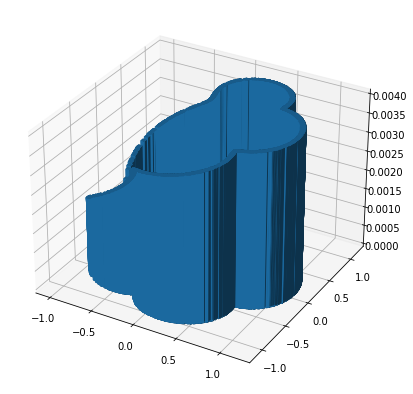

In [21]:
fig = plt.figure(figsize=(7, 7))
ax1 = fig.add_subplot(111, projection='3d')
#ax2 = fig.add_subplot(122, projection='3d')

ax1.bar3d(manifold_pts[:, 0], manifold_pts[:, 1], 0, 0.05, 0.05, dens, shade=True)

### Kernels

In [24]:
x = torch.linspace(-1.5, 1.5, 100).unsqueeze(-1)

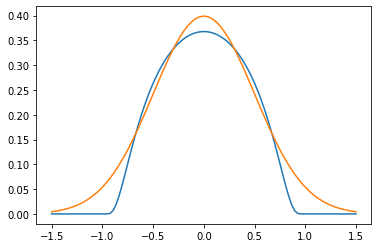

In [25]:
plt.plot(x[:, 0], Lambda(x))
plt.plot(x[:, 0], gauss(x)/2)

plt.show()

In [27]:
lambda_d = compute_lambda_d(1)

In [28]:
lambda_d

0.4439966082572937

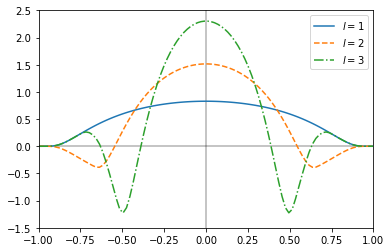

In [31]:
plot_kernels('../figs/kernels.png')

### Convergence

In [33]:
d = 1

lambda_d = compute_lambda_d(d)

In [34]:
beta = 2.

In [35]:
x = torch.tensor([1. + a, 0.])

In [36]:
unnormed_g = partial(example_1d_density, beta=beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

def density_at_zero(norm_const, a, w):
    return 1. / (norm_const * 2 * pi * (1. + a * w))

f_gt = density_at_zero(norm_const, a, w)

In [37]:
f_gt

tensor(0.1284)

In [38]:
def sample_f(beta, n_pts):
    pts = examlpe_1d_density_sampling(beta, int(n_pts))
    manifold_pts = example_parametric_curve(pts, a=a, w=w)
    return manifold_pts

In [41]:
N = 50
grid = np.logspace(np.log(100) / np.log(10), np.log(1e3) / np.log(10), 11)
#beta = 2
l = beta

coef, mse_n = collect_mse_convergence(beta, l, d, lambda_d, sample_f, x, f_gt, grid, N)

11it [00:58,  5.28s/it]


In [44]:
coef[0].item()

-0.8620224046974482

In [45]:
expected_rate = -.8

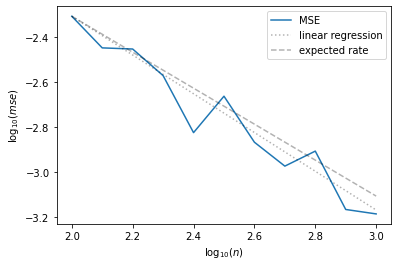

In [46]:
plot_convergence(grid, mse_n, coef, expected_rate, savepath='../figs/1d_manifold_experiment.png')

### 2d manifold example

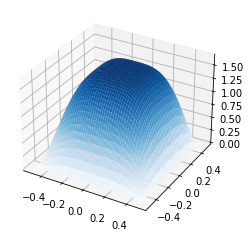

In [52]:
fig = plt.figure()
ax = fig.gca(projection='3d')

surf = plot_example_2d_density(ax, 3.)

#fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('../figs/2d_density.png')

In [55]:
b = 3

In [56]:
min_value, max_value = -.5, .5

In [57]:
linsp_x = torch.linspace(min_value, max_value, 1000)
linsp_y = torch.linspace(min_value, max_value, 1000)
mesh = torch.meshgrid(linsp_x, linsp_y)

v = mesh[0].reshape(-1)
u = mesh[1].reshape(-1)


manifold_pts = example_parametric_surface(v, u, a=a, b=b, w=w)

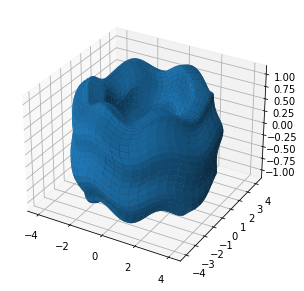

In [59]:
fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111, projection='3d')

manifold_pts = manifold_pts.reshape(1000, 1000, 3)

ax.plot_surface(manifold_pts[:, :, 0], manifold_pts[:, :, 1], manifold_pts[:, :, 2].numpy())
plt.show()

In [61]:
pts = example_2d_density_sampling(beta, int(1e3))
manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a, b, w)

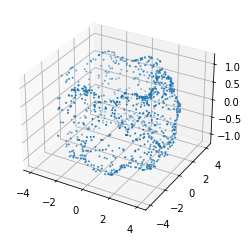

In [62]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

#manifold_pts = manifold_pts.reshape(1000, 1000, 3)

ax.scatter(manifold_pts[:, 0], manifold_pts[:, 1], manifold_pts[:, 2].numpy(), s=1.)
plt.show()

In [64]:
d = 2
lambda_d = compute_lambda_d(d)

In [65]:
beta = 2.

In [66]:
x = torch.tensor([1. + b, a, 0.])

In [67]:
def density_at_zero(norm_const, a, b, w):
    return 1. / (norm_const * 2 * pi)**2 * ((1. + a**2 * w**2) * ((b+1)**2 + a**2*w**2) - a**2*w**2)**(-.5)

unnormed_g = partial(example_1d_density, beta=beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

density_at_zero(norm_const, a, b, w)

f_gt = density_at_zero(norm_const, a, b, w)

In [71]:
def sample_f(beta, n_pts):
    pts = example_2d_density_sampling(beta, int(n_pts))
    manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a=a, b=b, w=w)

    return manifold_pts

In [72]:
N = 50
grid = np.logspace(np.log(100) / np.log(10), np.log(1e3) / np.log(10), 11)
#beta = 2
l = beta

coef, mse_n = collect_mse_convergence(beta, l, d, lambda_d, sample_f, x, f_gt, grid, N)

11it [02:04, 11.32s/it]


In [73]:
coef[0].item()

-0.5839101799846694

In [74]:
expected_rate = -.667

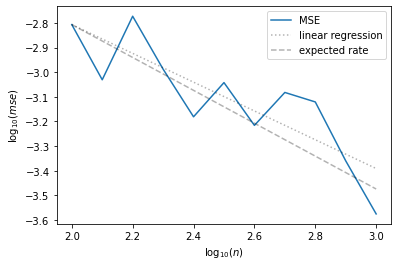

In [75]:
plot_convergence(grid, mse_n, coef, expected_rate, savepath='../figs/2d_manifold_experiment.png')